# Import

In [4]:
#%matplotlib inline
import os
import xarray as xr
import numpy as np
import shutil
import matplotlib.pyplot as plt
import pymistral
import pandas as pd
import seaborn as sns
sns.set_context('notebook')
import xskillscore as xs

import cdo
cdo = cdo.Cdo()
import intake
import fsspec
fsspec.config.conf['simplecache'] = {'cache_storage': '/work/mh0727/m300524/covid/cache', 'same_names':True}

zarr_store = '/work/mh0727/m300524/covid/post_zarr'

In [3]:
#!mamba install numpy==1.23 xarray dask distributed numba xskillscore matplotlib-base -y

In [6]:
import matplotlib as mpl

#import cmocean

mpl.rcParams["savefig.dpi"] = 150
mpl.rcParams["savefig.pad_inches"] = 0
mpl.rcParams["savefig.bbox"] = "tight"
#mpl.rcParams["savefig.format"] = "eps"

# Data

In [7]:
z = xr.open_zarr(zarr_store).rename({'co23D':'co2'}).astype('float32')

z.co2.attrs.update({'long_name': 'surface atmospheric CO2', 'name':'co2'})

z = z.assign_coords(experiment_id=[e.replace('ssp245-','') for e in z.experiment_id.values])

z.experiment_id

<xarray.DataArray 'experiment_id' (experiment_id: 5)>
array(['no-covid', 'cov-fossil', 'cov-modgreen', 'cov-strgreen', 'covid'],
      dtype='<U12')
Coordinates:
  * experiment_id  (experiment_id) <U12 'no-covid' 'cov-fossil' ... 'covid'

In [8]:
z['experiment_id'] = [str(e.values).replace("covid-baseline","no-covid") for e in z.experiment_id]

In [9]:
list(z.data_vars)

['abs550aer',
 'cLand',
 'co2',
 'fco2antt',
 'fco2fos',
 'fco2nat',
 'fgco2',
 'gpp',
 'intpp',
 'mlotst',
 'nbp',
 'nep',
 'nino12',
 'nino3',
 'nino34',
 'nino4',
 'npp',
 'o3',
 'od550aer',
 'od550lt1aer',
 'pdo',
 'pr',
 'rh',
 'tas',
 'tos',
 'uas',
 'vas']

In [83]:
indices = [v for v in z.data_vars if set(z[v].dims) == set(["member_id", "time", "experiment_id"])]
indices

['nino12', 'nino3', 'nino34', 'nino4', 'pdo']

In [88]:
z.mean(["i","j"]).weighted(np.cos(np.deg2rad(z.lon))).mean(["lon","lat"]).to_netcdf("data/global_aggregated.nc")

In [10]:
import cdo
cdo = cdo.Cdo()
area = cdo.gridarea(input='/work/mh0727/m300524/covid/CMOR/outdata_land/ssp245-covid-009_Lmon_co23D.nc',returnXDataset=True).cell_area

In [11]:
area = area.assign_coords(lat=z.lat,lon=z.lon)

In [12]:
area_curv = xr.open_dataset('/work/mh0727/m300524/masks/GR15_area.nc')['area'].squeeze(drop=True).rename({'y':'j','x':'i'})

# Functions

In [13]:
def stack_members(ds):
    dsms = ds.stack(member=['member_id','experiment_id'])
    # stacking scenarios into members
    dsms = dsms.assign_coords(member=np.arange(dsms.member.size)).rename({'member':'member_id'})
    return dsms

In [14]:
# split into months and annual

def to_monthly(ds):
    year = ds.time.dt.year
    month = ds.time.dt.month

    # assign new coords
    ds = ds.assign_coords(year=("time", year), month=("time", month))

    # reshape the array to (..., "month", "year")
    return ds.set_index(time=("year", "month")).unstack("time")

def yearmean(ds): return ds.groupby('time.year').mean()#.rename({'year':'time'})

In [15]:
def global_aggregate(da,area=area):
    spatial_dims = [d for d in da.dims if d not in ['experiment_id', 'member_id','time']]
    if 'units' in da.attrs:
        if 'm-2' in da.attrs['units']:
            how='sum'
        else:
            how='mean'
    else:
        how='mean'
    if how == 'mean':
        da = da.weighted(area).mean(spatial_dims)
    elif how =='sum':
        da = (da*area).sum(spatial_dims)
        da.attrs['units'] = da.attrs['units'].replace('m-2','')
    if 'units' in da.attrs:
        if 's-1' in da.attrs['units'] and 'arbon' in da.attrs['long_name']:
            da = da*365*24*3600*1e-12
            da.attrs['units'] = da.attrs['units'].replace('kg','PgC').replace('s-1','yr-1')
    return da

In [16]:
color_dict=dict()
color_dict['ocean'] = 'cornflowerblue'
color_dict['land'] = 'mediumseagreen'
color_dict['land and ocean'] = '#00407F'
color_dict['no']='k'

color_timeseries = {'no-covid':'k',"covid":'blue','cov-fossil':'orange','cov-modgreen':'palegreen','cov-strgreen':'green'}

In [17]:
#!ls /work/bm1124/m300086/input/emissions_covid19/for_echam6

In [18]:
#xr.open_dataset('/work/bm1124/m300086/input/emissions_covid19/for_echam6/MACv2.0-SP_scenario_TwoYearBlip.nc')

# forcing

In [19]:
global_emissions = (z.fco2fos.mean('member_id')*area).sum(['lon','lat'], skipna=False).compute()

global_emissions = global_emissions*60*60*24*365*1e-12
global_emissions.attrs.update({'units':'PgC yr-1'})
#global_emissions.plot(hue='experiment_id')

In [78]:
global_emissions.to_netcdf("data/global_emissions.nc")

In [20]:
area_curv['lat']=z.latitude
area_curv['lon']=z.longitude

In [21]:
gco2 = (z.co2.weighted(area)).mean(['lon','lat'], skipna=False).compute()

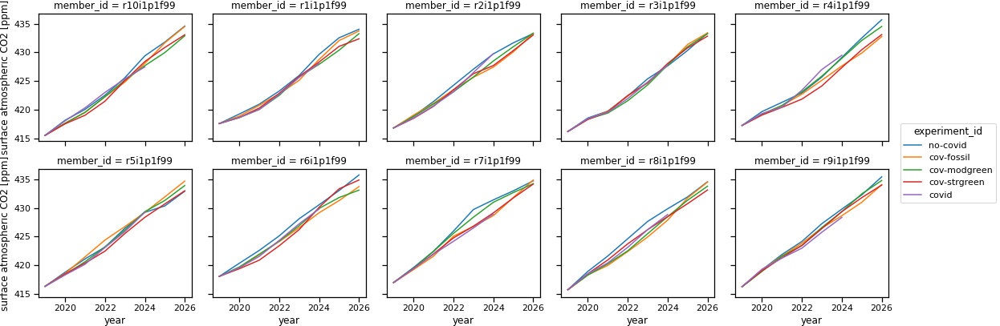

In [22]:
yearmean(gco2).sel(year=slice(2019,2026)).plot(col='member_id',x='year',hue='experiment_id', col_wrap=5)

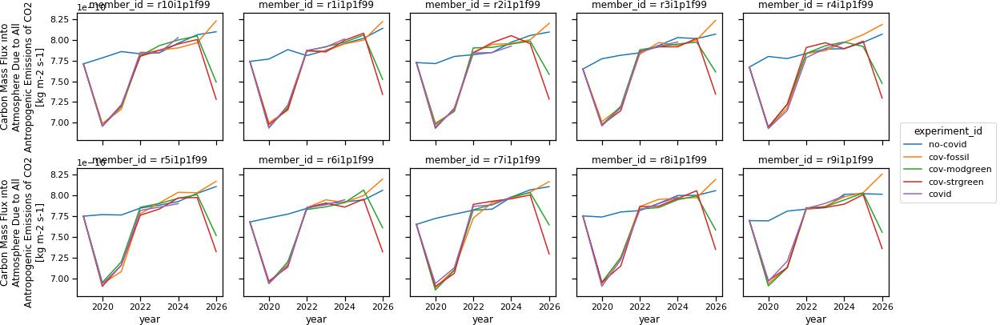

In [23]:
antt = (z.fco2antt.weighted(area)).mean(['lon','lat'], skipna=False).compute()
yearmean(antt).sel(year=slice(2019,2026)).plot(col='member_id',x='year',hue='experiment_id', col_wrap=5)

In [24]:
gfco2nat = (z[['fco2nat']] * area).sum(['lon','lat']).compute()
gfco2nat['nbp'] = (-z['nbp'] * area).sum(['lon','lat']).compute()
gfco2nat['fgco2'] = (-z.fgco2*area_curv).sum(['i','j']).compute()
gfco2nat=gfco2nat*60*60*24*365*1e-12
gfco2nat['co2']=gco2*2.12/.6
for v in gfco2nat.data_vars:
    gfco2nat[v].attrs.update({'units':'PgC yr-1'})

gfco2nat['fco2nat'] = gfco2nat['nbp'] + gfco2nat['fgco2']
gfco2nat = gfco2nat.rename({'fco2nat':'land and ocean','nbp':'land','fgco2':'ocean'})

#gfco2nat.to_array().mean('member_id').sel(time=slice('2015','2024')).plot(hue='experiment_id', col='variable')

In [25]:
#(gfco2nat['land and ocean'] - gfco2nat['ocean'] - gfco2nat['land']).mean('member_id').sel(time=slice('2015','2024')).plot(hue='experiment_id')

In [26]:
gfco2nat = xr.concat([
    stack_members(gfco2nat.drop_sel(experiment_id='no-covid')).assign_coords(experiment_id='covid'),
    gfco2nat.sel(experiment_id='no-covid').isel(member_id=list(np.arange(gfco2nat.member_id.size))*4).assign_coords(member_id=np.arange(gfco2nat.member_id.size*4))
], dim='experiment_id')

In [27]:
gfco2nat = gfco2nat.sel(time=slice('2015','2024'))

In [28]:
diff = gfco2nat.sel(experiment_id='covid') - gfco2nat.sel(experiment_id='no-covid')

In [29]:
emissions_diff = (global_emissions.sel(experiment_id='covid') - global_emissions.sel(experiment_id='no-covid')).dropna('time')

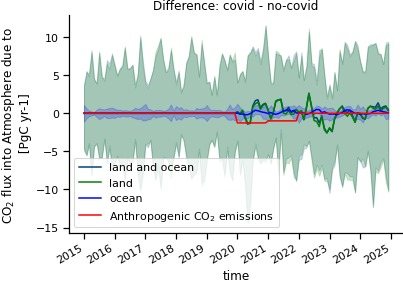

In [30]:
for v in diff.data_vars:#v='land and ocean'
    if v == 'land and ocean':
        c = '#00407F'
    elif v == 'land':
        c='green'
    elif v == 'ocean':
        c='blue'
    elif v=='co2':
        c='black'
        continue
    plt.fill_between(diff.time.values, diff[v].min('member_id'), diff[v].max('member_id'), alpha=.2, color=c)
    diff[v].mean('member_id').plot(label=v, color=c)
emissions_diff.plot(label='Anthropogenic CO$_2$ emissions', color='r')
plt.title('Difference: covid - no-covid')
plt.ylabel('CO$_2$ flux into Atmosphere due to \n [PgC yr-1]')
#plt.ylim([-20,20])
sns.despine()
plt.legend(loc='lower left')

In [31]:
diff_ym = yearmean(diff)
emissions_diff_ym = yearmean(emissions_diff)

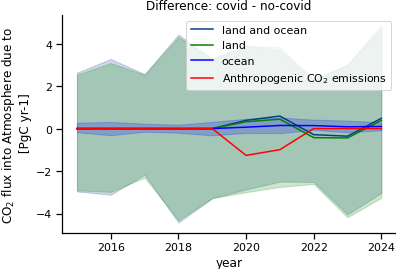

In [32]:
for v in diff_ym.data_vars:#v='land and ocean'
    if v == 'land and ocean':
        c = '#00407F'
    elif v == 'land':
        c='green'
    elif v == 'ocean':
        c='blue'
    elif v =='co2':
        c='k'
        continue
    plt.fill_between(diff_ym.year.values, diff_ym[v].min('member_id'), diff_ym[v].max('member_id'), alpha=.2, color=c)
    diff_ym[v].mean('member_id').plot(label=v, color=c)
emissions_diff_ym.plot(label='Anthropogenic CO$_2$ emissions', color='r')
plt.title('Difference: covid - no-covid')
plt.ylabel('CO$_2$ flux into Atmosphere due to \n [PgC yr-1]')
#plt.ylim([-16,16])
sns.despine()
plt.legend()

In [33]:
((global_emissions.sel(experiment_id='no-covid') - global_emissions.sel(experiment_id='covid')).sel(time=slice('2020',None)).cumsum('time')/12).isel(time=-1).values,'PgC cumulative emission reductions over two years'

(array(2.25543567), 'PgC cumulative emission reductions over two years')

In [34]:
air_bourne_fraction=.6
2.255*air_bourne_fraction/2.141

0.6319476879962634

> thats globally ~ 0.6 ppm after airborne fraction

# CO2 response

In [30]:
gco2_short = z.sel(time=slice('2015','2024')).co2.weighted(area).mean(['lon','lat']).compute()
#gco2_long = z.co2.weighted(area).mean(['lon','lat']).compute()

In [31]:
co2_hist = xr.open_dataset('esm-hist_co2.nc',chunks={})

In [32]:
co2_hist = co2_hist*(28.8 / 44.0095)/0.658267

In [33]:
co2_hist = co2_hist.assign_coords(member_id=z.member_id, lat=z.lat, lon=z.lon).isel(experiment_id=0,drop=True).expand_dims(experiment_id=z.experiment_id)

In [34]:
gco2_long = xr.merge([co2_hist.co2,z['co2']]).co2.weighted(area).mean(['lon','lat']).compute()

In [35]:
gco2_short = yearmean(gco2_short)

In [36]:
gco2_long = yearmean(gco2_long)

In [37]:
gco2_short = xr.concat([
    stack_members(gco2_short.drop_sel(experiment_id='no-covid')).assign_coords(experiment_id='covid'),
    gco2_short.sel(experiment_id='no-covid').isel(member_id=list(np.arange(gco2_short.member_id.size))*4).assign_coords(member_id=np.arange(gco2_short.member_id.size*4))
], dim='experiment_id')

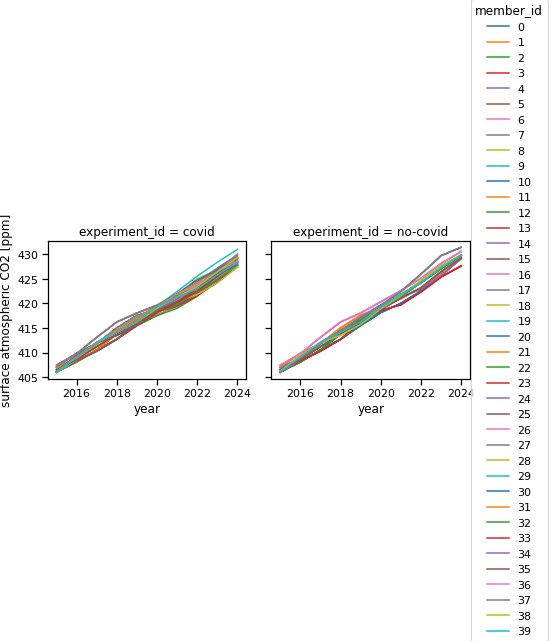

In [38]:
gco2_short.plot(x='year', hue='member_id', col='experiment_id')

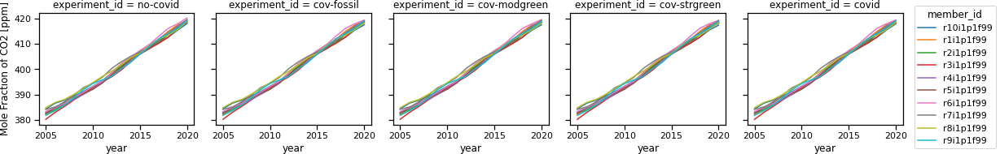

In [39]:
gco2_long.sel(year=slice(2005,2020)).plot(x='year', hue='member_id', col='experiment_id')

# causation

In [35]:
start=2015
mitigation_date=2019 # means 2020 emissions cut
end=2024

In [36]:
def slope(da, dim='time'):
    deg=1
    return da.polyfit(dim=dim, deg=deg).sel(degree=deg,drop=True)

In [37]:
CONCAT_KWARGS={'coords':'minimal','compat':'override'}
print_res=True
trend_func=slope
def xr_concat_trends(ds,start=2015,mitigation_date=2020,end=2025,dim='year', stride=1):
    """Calc all trends between start and end for mitigation_date possible and concat."""
    mid = int((end-start+1)/2+start)-1
    assert mid == mitigation_date
    max_trendlength=int((end-start+1)/2)
    
    early_list=[]
    late_list=[]
    period_list=[]
    length=[]
    for i,i_start_year in enumerate(np.arange(start,mitigation_date-0, stride)):
        i_trendlength = mid-i_start_year+1
        i_end_year = mid+i_trendlength
        early = trend_func(ds.sel({dim:slice(i_start_year,mid)}),dim=dim)
        late = trend_func(ds.sel({dim:slice(mid+1,i_end_year)}),dim=dim)
        print('Trends',i_start_year,'-',mid,mid+1,'-',i_end_year, 'Trendlength:', i_trendlength)
        early_list.append(early)
        late_list.append(late)
        period_list.append(f'{i_start_year}-{i_end_year}')
        length.append(i_trendlength)
    early = xr.concat(early_list,'trendlength',**CONCAT_KWARGS)
    late = xr.concat(late_list,'trendlength',**CONCAT_KWARGS)
    periods = xr.concat([early,late],'timing',**CONCAT_KWARGS)
    periods['timing'] = ['before','after']
    periods['periods'] = period_list
    periods['trendlength'] = length
    #periods=periods.assign_coords('periods',(length,))
    return periods.sortby('trendlength')

In [38]:
def xr_trend_probability(trends, event='weaker'):
    # whats a successful climate mitigation event?
    """Trends from `xr_concat_trends` to probability in %."""
    trend_late = trends.sel(timing='after')
    trend_early = trends.sel(timing='before')
    if event=='stronger':
        diff = trend_late - trend_early
    elif event=='weaker':
        diff = trend_early - trend_late
    else:
        raise ValueError('not impl')
    P=(diff>0).sum('member')/trends.member.size
    return P

In [39]:
from tqdm import trange
def bootstrapping(ds,func,dim='member',bootstrap=5, replacement=True, **func_kwargs):
    bootstraped_results = []
    dim_to_shuffle = ds[dim].values
    length = len(dim_to_shuffle)//2
    for _ in trange(bootstrap):
        if replacement:
            smp_dim = np.random.choice(dim_to_shuffle, len(dim_to_shuffle))
        else:
            dim_to_shuffle = ds[dim].values
            smp_dim = np.random.choice(dim_to_shuffle, replace=False, size=length)
            dim_to_shuffle = ds[dim].isel({dim:slice(None,length)}).values
        smp_ds = ds.sel({dim:smp_dim})
        smp_ds[dim] = dim_to_shuffle
        b_res=func(smp_ds, **func_kwargs)
        bootstraped_results.append(b_res)
    res = xr.concat(bootstraped_results, 'bootstrap')#.quantile( sig / 100, 'bootstrap')
    return res

In [40]:
#trends = xr_concat_trends(diagnosed2)
#P = bootstrapping(trends, xr_trend_probability, bootstrap=5)

In [41]:
def P_to_P_causual(event_summary, mitigation_scenario='covid',no_mitigation_scenarios=['no-covid']):
    if isinstance(no_mitigation_scenarios, str):
        no_mitigation_scenarios = [no_mitigation_scenarios]
    P_list=[]
    for comparison_no_mitigation in no_mitigation_scenarios:
        P_mit = event_summary.sel(ext=mitigation_scenario,drop=True)
        P_no_mit = event_summary.sel(ext=comparison_no_mitigation,drop=True)
        P_S = (P_mit - P_no_mit) / (1 - P_no_mit)
        P_N = 1 - (P_no_mit / P_mit)
        P_NS = P_mit - P_no_mit
        P_list.append(xr.concat([P_S, P_N, P_NS, P_mit, P_no_mit],dim='P',**CONCAT_KWARGS))
    P = xr.concat(P_list,'comparison',**CONCAT_KWARGS)
    P['P'] = ['P_S', 'P_N', 'P_NS','P_mit', 'P_no_mit']
    comparison_list = [f'{mitigation_scenario}_vs_{no_mit}' for no_mit in no_mitigation_scenarios]
    P['comparison'] = comparison_list#['rcp2.6_vs_rcp4.5','rcp2.6_vs_rcp8.5']
    P = P.squeeze() * 100 # convert to %
    # correct for neg values: not needed?!
    P = P.where(P >= 0, other=0) 
    P = P.where(P <= 100, other=100) 
    return P

In [42]:
def output_to_P_caus(ds, start=start,mitigation_date=mitigation_date,end=end,
                     mitigation_scenario='covid',no_mitigation_scenarios=['no-covid'], bootstrap=None):
    """Combining the whole workflow."""
    trends = xr_concat_trends(ds,start=start,mitigation_date=mitigation_date,end=end)
    if bootstrap is not None:
        P = bootstrapping(trends, xr_trend_probability, bootstrap=bootstrap)
    else:
        P = xr_trend_probability(trends, event='weaker')
    P = P.clip(0,1)
    res = P_to_P_causual(P,no_mitigation_scenarios=no_mitigation_scenarios, mitigation_scenario=mitigation_scenario)
    if isinstance(res,xr.Dataset):
        vv=list(res.data_vars)[0]
        res=res[vv]
    res = res.rename('Probability trend reduction')
    res.attrs['units']='%'
    return res

In [43]:
bootstrap=500

In [49]:
P_caus_short = output_to_P_caus(gco2_short.rename({'member_id':'member', 'experiment_id':'ext'}), bootstrap=bootstrap)

  7%|▋         | 34/500 [00:00<00:05, 87.10it/s]

Trends 2015 - 2019 2020 - 2024 Trendlength: 5
Trends 2016 - 2019 2020 - 2023 Trendlength: 4
Trends 2017 - 2019 2020 - 2022 Trendlength: 3
Trends 2018 - 2019 2020 - 2021 Trendlength: 2


100%|██████████| 500/500 [00:01<00:00, 283.94it/s]


In [50]:
P_caus_long = output_to_P_caus(gco2_long.rename({'member_id':'member', 'experiment_id':'ext'}),
                               mitigation_scenario='cov-strgreen', start=start-5,mitigation_date=2024,end=2034+5, bootstrap=bootstrap)

  5%|▌         | 27/500 [00:00<00:01, 265.37it/s]

Trends 2010 - 2024 2025 - 2039 Trendlength: 15
Trends 2011 - 2024 2025 - 2038 Trendlength: 14
Trends 2012 - 2024 2025 - 2037 Trendlength: 13
Trends 2013 - 2024 2025 - 2036 Trendlength: 12
Trends 2014 - 2024 2025 - 2035 Trendlength: 11
Trends 2015 - 2024 2025 - 2034 Trendlength: 10
Trends 2016 - 2024 2025 - 2033 Trendlength: 9
Trends 2017 - 2024 2025 - 2032 Trendlength: 8
Trends 2018 - 2024 2025 - 2031 Trendlength: 7
Trends 2019 - 2024 2025 - 2030 Trendlength: 6
Trends 2020 - 2024 2025 - 2029 Trendlength: 5
Trends 2021 - 2024 2025 - 2028 Trendlength: 4
Trends 2022 - 2024 2025 - 2027 Trendlength: 3
Trends 2023 - 2024 2025 - 2026 Trendlength: 2


100%|██████████| 500/500 [00:01<00:00, 266.99it/s]


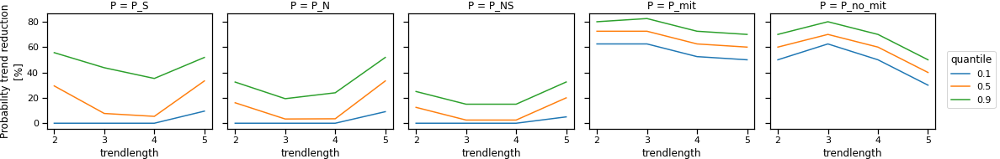

In [51]:
P_caus_short.quantile(q=[0.1,.5,.9],dim='bootstrap').plot(hue='quantile',col='P')

In [ ]:
import seaborn as sns
#colors = ["baby blue", "medium blue", "dark blue", "faded green", "faded red"]
#cmap = sns.xkcd_palette(colors)
#sns.set_palette(cmap)

def passing_threshold(ds, threshold=95):
    p_list=[]
    for p in ds.P:
        if p == 'P_no_mit':
            threshold_used = 100-threshold
            b = (ds.sel(P=p)>threshold_used)
        else:
            threshold_used = threshold
            b = (ds.sel(P=p)<threshold_used)
        b = b.idxmin('trendlength')
        p_list.append(b)
        
    reached = xr.concat(p_list,dim='P')
    reached['threshold']=threshold
    reached = reached.rename('Certainty for')
    reached.attrs['units']='year trends'
    # reset to nan
    reached = reached.where(reached!=ds.trendlength.min(),np.nan)
    return reached

def plot_P_caus_over_trendlength(P_caus, threshold_reached=False, ax=None, shift_x=0.05,
                                 colors=["baby blue", "medium blue", "dark blue", "faded green", "faded red"]):
    cmap = sns.xkcd_palette(colors)
    P_caus = P_caus.clip(0,100)
    #sns.set_palette(cmap)
    if ax is None:
        fig,ax=plt.subplots()
    #P_caus.plot(hue='P',ylim=[-12,102],ax=ax)
    for i,P in enumerate(P_caus.P.values):
        PP = P_caus.sel(P=P)
        yerr = [PP.mean('bootstrap')-PP.quantile(q=0.025,dim='bootstrap'), -PP.mean('bootstrap')+PP.quantile(q=0.975,dim='bootstrap')]
        ax.errorbar(PP.trendlength+(i-2)*shift_x, PP.mean('bootstrap'), yerr=yerr, color=cmap[i], label=P,
                    marker='o', capsize=4, elinewidth=1)
        #P_caus.sel(P=P).mean('bootstrap').plot(ax=ax, color=cmap[i], label=P)
    ax.legend(ncol=2, loc='center right',columnspacing=.5, handletextpad=.5, handlelength=1)
    ax.set_ylim([-2,102])
    #plt.axvline(x=15,ls=':',c='gray', label='Marotzke 2019')
    xmin=0#P_caus.trendlength.min()
    xmax=1#P_caus.trendlength.max()
    for y in [0,100]:
        ax.axhline(y=y,xmin=xmin,xmax=xmax,ls=':',c='gray',lw=.5)
    if threshold_reached:
        if isinstance(threshold_reached, int):
            threshold_reached = passing_threshold(P_caus,threshold=threshold_reached)
        ax.axhline(y=threshold_reached['threshold'],xmin=xmin,xmax=xmax,ls='--',c='gray', label='threshold')
        ax.axhline(y=100-threshold_reached['threshold'],xmin=xmin,xmax=xmax,ls='--',c='gray', label='threshold')
        # plot where causation
        for i, p in enumerate(threshold_reached.P.values):
            x = threshold_reached.sel(P=p)
            if ~x.isnull():
                x=x.values
                plt.scatter(x,-9,marker='^',c=[cmap[i]], label='certain',ax=ax)
                plt.text(x,-6, str(int(x)),color=cmap[i],va='bottom',ha='center',fontsize='small',ax=ax)
                print(str(p),'certain',str(x))
            #else:
            #    print(str(p),'uncertain')
    plt.xlabel('Trendlength around 2020')
    plt.xlim([P_caus.trendlength.min() - 0.25, 0.25 + P_caus.trendlength.max()])
    plt.xticks(range(int(P_caus.trendlength.min()), int(P_caus.trendlength.max()+1)))
    sns.despine()

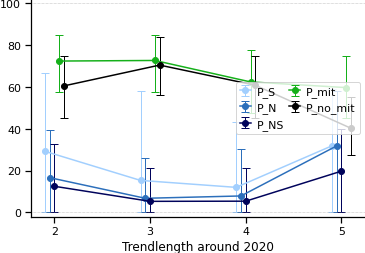

In [53]:
plot_P_caus_over_trendlength(P_caus_short, colors=["baby blue", "medium blue", "dark blue", "green", "black"])

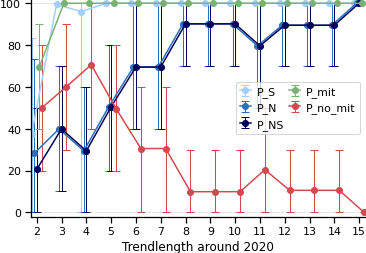

In [54]:
plot_P_caus_over_trendlength(P_caus_long, threshold_reached=False, shift_x=.1)

In [56]:
gco2_long = gco2_long.sel(experiment_id=['no-covid','covid','cov-fossil','cov-modgreen', 'cov-strgreen'])

In [3]:
def plot_ensembles(eumax, ax=None,mitigation_date=mitigation_date, color_dict=color_timeseries):
    if ax is None:
        ax = plt.gca()

    for i,e in enumerate(eumax.experiment_id.values):
        if color_dict is not None and e in color_dict.keys():
            color_kwargs={'color': str(color_dict[e])}
        else:
            color_kwargs={}
        eumax_mean = eumax.sel(experiment_id=e).mean('member_id')
        eumax_q = eumax.sel(experiment_id=e).quantile(q=[.05,.95],dim='member_id',skipna=True)
        ax.fill_between(eumax.year, eumax_q.isel(quantile=1),eumax_q.isel(quantile=0),alpha=.2, **color_kwargs)
        eumax_mean.plot(label=str(e),ax=ax, **color_kwargs)
    if isinstance(mitigation_date, str):
        mitigation_date = [mitigation_date]
    ax.axvline(x=mitigation_date[0],c='gray',ls='--',label='mitigation start')
    for i,m in enumerate(mitigation_date):
        if i!=0:
            ax.axvline(x=mitigation_date[i],c='gray',ls='--')
    tmax=eumax.year.max()
    d=tmax-mitigation_date[0]
    ax.set_xlim([mitigation_date[0]-d,mitigation_date[0]+d])
    ax.legend(loc='upper left')
    ax.set_title('')
    ax.set_xlabel('Time [year]')
    ax.set_ylabel('')

NameError: name 'mitigation_date' is not defined

TypeError: 'int' object is not subscriptable

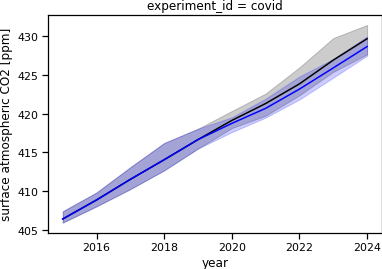

In [58]:
plot_ensembles(gco2_short.sel(experiment_id=['no-covid','covid']))

In [ ]:
plot_ensembles(gco2_long, mitigation_date=2024)

# Figures

In [48]:
def add_figurelabels(ax,labels='abcdefghijklmnopqrstuvwxyz',shift=0,labelsize=None,frameon=False, loc=2, pad=.25, borderpad=.1,**kwargs):
    from mpl_toolkits.axes_grid.anchored_artists import AnchoredText
    for i,axes in enumerate(ax.flatten()):
        axes.add_artist(AnchoredText(f'{labels[i+shift]})', prop=dict(size=labelsize),
                                     frameon=frameon, loc=loc, pad=pad, borderpad=borderpad))
    return ax

def annotate_figurelabels(
    ax,
    labels="abcdefghijklmnopqrstuvwxyz",
    shift=0,
    xy=(0.03, 0.95),
    xycoords="axes fraction",
    **kwargs,
):
    from mpl_toolkits.axes_grid.anchored_artists import AnchoredText

    for i, axes in enumerate(ax.flatten()):
        axes.annotate(
            f"{labels[i+shift]})", xy=xy, xycoords=xycoords, zorder=101, **kwargs
        )
    return ax

## Fig. 1

In [183]:
#gco2_short.sel(experiment_id=['no-covid','covid']).isel(year=-1).diff('experiment_id').plot.hist()

In [188]:
#gco2_short.sel(experiment_id=['no-covid','covid']).isel(year=-1).diff('experiment_id').mean('member_id').values

In [187]:
#gco2_short.sel(experiment_id=['no-covid','covid']).sel(year=[2020,2024]).diff('year').diff('experiment_id').mean('member_id').values

In [ ]:
causation_colors = ['pale orange','brownish orange','dark orange'] #['light grey','medium grey','warm grey']
fig, ax=plt.subplots(2,2, figsize=(10,8))
# short
plot_ensembles(gco2_short.sel(experiment_id=['no-covid','covid']),ax=ax[0,0], mitigation_date=2019+.5)

plot_P_caus_over_trendlength(P_caus_short.assign_coords(P=['P_S','P_N','P_NS','P_covid','P_no-covid']), ax=ax[0,1], threshold_reached=False,
                             colors=causation_colors+['black','blue'])

# long
plot_ensembles(gco2_long.sel(year=slice(2015-5,2035+5)).sel(
    experiment_id=['no-covid', 'cov-fossil', 'cov-modgreen', 'cov-strgreen','covid']),
               ax=ax[1,0], mitigation_date=2024+.5)
ax[1,0].set_xticks(np.arange(2015-5,2036+5,5))
ax[0,0].set_xlim([2014.5,2024.5])
ax[1,0].set_xlim([2014-5.5,2034.5+5])

plot_P_caus_over_trendlength(P_caus_long.assign_coords(P=['P_S','P_N','P_NS','P_cov-strgreen','P_no-covid']), threshold_reached=False, ax=ax[1,1],
                             colors=causation_colors +['green','black'], shift_x=.1)

ax[0,0].set_ylabel('global atmospheric CO$_2$ [ppm]')
ax[1,0].set_ylabel('global atmospheric CO$_2$ [ppm]')
ax[0,1].set_xlim([2-.25,10.25])
ax[0,1].set_xlabel('Trendlength around 2020')
ax[1,1].set_xlabel('Trendlength around 2025')
ax[0,1].set_title('covid vs no-covid separating in 2020')
ax[1,1].set_title('covid-strgreen vs no-covid separating in 2025')

for i in [0,1]:
    ax[i,1].set_ylabel('Probability of trend reduction (causation) [%]')

#ax[1,1].get_legend().remove()
ax[0,0].get_legend().remove()

annotate_figurelabels(ax)

ax[0,0].annotate(s='short-term response', xy=(0.015,0.765), xycoords='figure fraction', fontsize=18,
        verticalalignment='center',
        rotation='vertical')


ax[1,0].annotate(s='long-term response', xy=(0.015,0.265), xycoords='figure fraction', fontsize=18,
        verticalalignment='center',
        rotation='vertical')

plt.tight_layout()
plt.savefig(f'Fig_1_causation_co2_timeseries')

## Fig. 2

maps co2 short-term

In [44]:
co2 = z[['co2','fco2nat']]

#co2 = xr.concat([to_monthly(co2),yearmean(co2).assign_coords(month='mean')],'month')
co2 = yearmean(co2)
co2 = xr.concat([
    stack_members(co2.drop_sel(experiment_id='no-covid')).assign_coords(experiment_id='covid'),
    co2.sel(experiment_id='no-covid').isel(member_id=list(np.arange(co2.member_id.size))*4).assign_coords(member_id=np.arange(co2.member_id.size*4))
], dim='experiment_id')

In [45]:
%time co2 = co2.load()

CPU times: user 7.31 s, sys: 8.13 s, total: 15.4 s
Wall time: 1.44 s


In [46]:
%time P_caus_co2 = output_to_P_caus(co2.co2.rename({'member_id':'member', 'experiment_id':'ext'}))

Trends 2015 - 2019 2020 - 2024 Trendlength: 5
Trends 2016 - 2019 2020 - 2023 Trendlength: 4
Trends 2017 - 2019 2020 - 2022 Trendlength: 3
Trends 2018 - 2019 2020 - 2021 Trendlength: 2
CPU times: user 32.9 s, sys: 1min 40s, total: 2min 13s
Wall time: 1.86 s


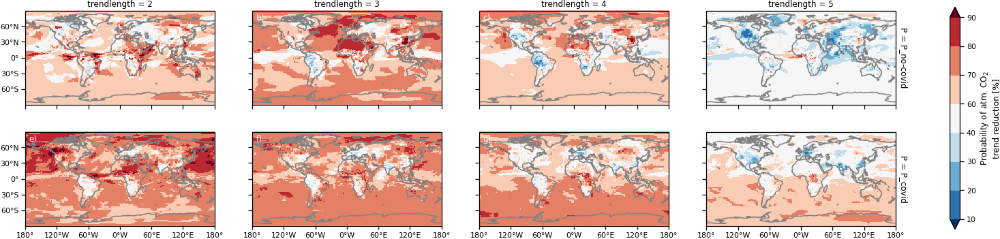

In [179]:
# call cells below
fg = P_caus_co2.sel(P=['P_no_mit','P_mit']).assign_coords(P=['P_no-covid','P_covid']).rename('Probability of atm. CO$_2$ trend reduction').plot_map(
    col='trendlength', row='P', aspect=2.3, cmap='RdBu_r', levels=[10,20,30,40,60,70,80,90], cbar_kwargs=dict(shrink=1))
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
plt.savefig(f'Fig_2_probability_co2_maps')

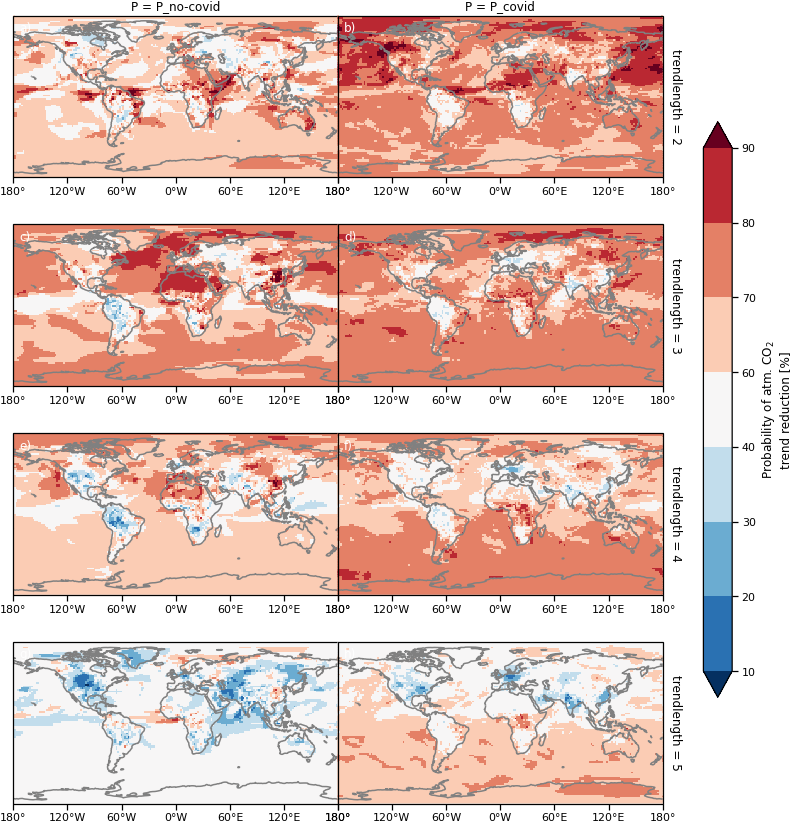

In [75]:
# reformat
fg = P_caus_co2.sel(P=['P_no_mit','P_mit']).assign_coords(P=['P_no-covid','P_covid']).rename('Probability of atm. CO$_2$ trend reduction').plot_map(
    row='trendlength', col='P', aspect=1.8, cmap='RdBu_r', levels=[10,20,30,40,60,70,80,90], cbar_kwargs=dict(shrink=.7))
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
fg.axes[0][1].yaxis.set_major_formatter("")
fg.axes[0][1].set_yticks([])
plt.savefig(f'Fig_2_probability_co2_maps_reformat')

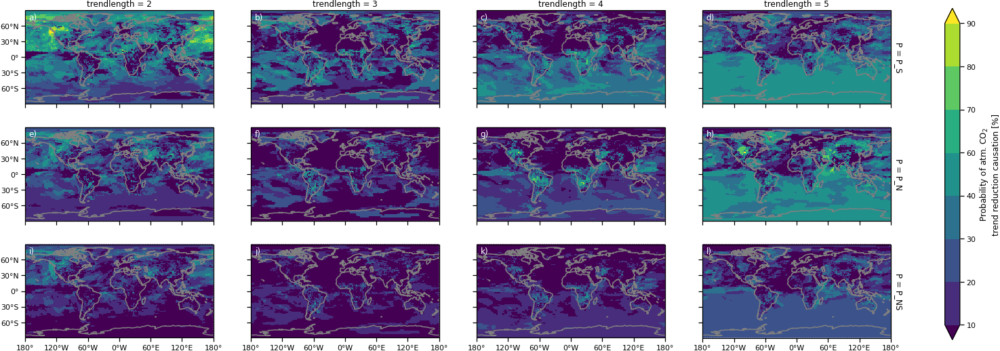

In [180]:
# call cells below
fg = P_caus_co2.drop_sel(P=['P_no_mit','P_mit']).rename('Probability of atm. CO$_2$ trend reduction causation').plot_map(
    col='trendlength', row='P', aspect=2.3, cmap='viridis', levels=[10,20,30,40,60,70,80,90], cbar_kwargs=dict(shrink=1))
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
plt.savefig(f'Fig_SI_causation_co2_maps')

### long-term

In [169]:
co2_long = yearmean(z[['co2','fco2nat']]).sel(experiment_id=['cov-strgreen','no-covid']).sel(year=slice(None,2034)).compute()

In [170]:
P_caus_co2_long = output_to_P_caus(co2_long.co2.rename({'member_id':'member', 'experiment_id':'ext'}), mitigation_scenario='cov-strgreen', start=start,mitigation_date=2024,end=2034)

Trends 2015 - 2024 2025 - 2034 Trendlength: 10
Trends 2016 - 2024 2025 - 2033 Trendlength: 9
Trends 2017 - 2024 2025 - 2032 Trendlength: 8
Trends 2018 - 2024 2025 - 2031 Trendlength: 7
Trends 2019 - 2024 2025 - 2030 Trendlength: 6
Trends 2020 - 2024 2025 - 2029 Trendlength: 5
Trends 2021 - 2024 2025 - 2028 Trendlength: 4
Trends 2022 - 2024 2025 - 2027 Trendlength: 3
Trends 2023 - 2024 2025 - 2026 Trendlength: 2


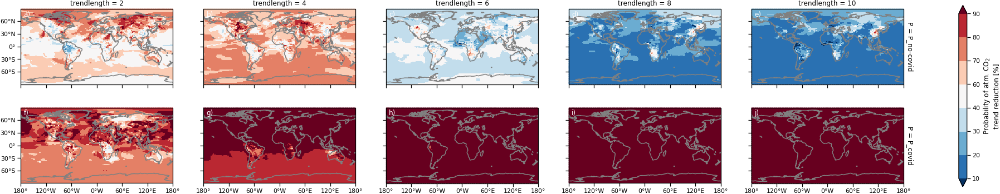

In [173]:
# call cells below
fg = P_caus_co2_long.sel(trendlength=slice(None,None,2)).sel(P=['P_no_mit','P_mit']).assign_coords(
    P=['P_no-covid','P_covid']).rename('Probability of atm. CO$_2$ trend reduction').plot_map(
    col='trendlength', row='P', aspect=2.3, cmap='RdBu_r', vmin=20, vmax=80, levels=[10,20,30,40,60,70,80,90], cbar_kwargs=dict(shrink=1))
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
plt.savefig(f'Fig_SI_probability_co2_maps_long')

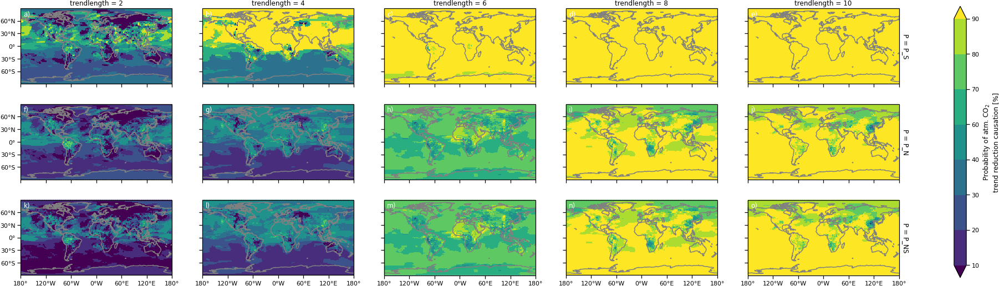

In [174]:
fg = P_caus_co2_long.isel(trendlength=slice(None,None,2)).drop_sel(P=['P_no_mit','P_mit']).rename('Probability of atm. CO$_2$ trend reduction causation').plot_map(
    col='trendlength', row='P', aspect=2.3, cmap='viridis', levels=[10,20,30,40,60,70,80,90], cbar_kwargs=dict(shrink=1))
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
plt.savefig(f'Fig_SI_causation_co2_maps_long')

## Fig. 3

In [49]:
af = .6

start,end='2015','2019'
#start,end='2020','2024'
#airborne_fraction = gcb['atmospheric growth']/gcb['fossil fuel and industry']
fos = yearmean((z.fco2fos.sel(time=slice(start,end))*area).sum(['lat','lon'])).mean('member_id').compute()*60*60*24*365*1e-12
nat = yearmean((z.fco2nat.sel(time=slice(start,end))*area).sum(['lat','lon'])).mean('member_id').compute()*60*60*24*365*1e-12
Co2 = yearmean(z.co2.sel(time=slice(start,end)).weighted(area).mean(['lat','lon'])).mean('member_id').compute().diff('year')
af = (Co2*2.124/fos)
#af

af.mean().values,'+/-',af.std().values

(array(0.54438326), '+/-', array(0.01467377))

In [50]:
af=af.mean().values

In [51]:
c = (z.co2.sel(time=slice('2020','2024')).weighted(area).mean(['lat','lon']))

In [52]:
c = xr.concat([
    stack_members(c.drop_sel(experiment_id='no-covid')).assign_coords(experiment_id='covid'),
    c.sel(experiment_id='no-covid').isel(member_id=list(np.arange(c.member_id.size))*4).assign_coords(member_id=np.arange(c.member_id.size*4))
], dim='experiment_id').compute()

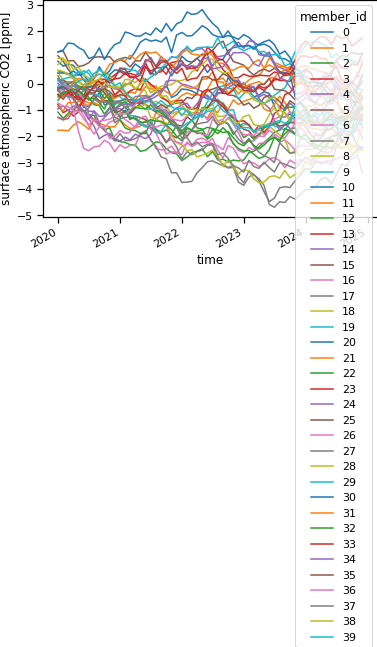

In [53]:
(c.sel(experiment_id='covid')-c.sel(experiment_id='no-covid')).plot(hue='member_id')
plt.show()

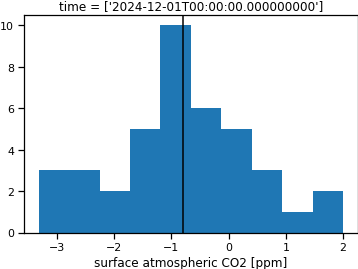

In [54]:
d=(c.sel(experiment_id='covid')-c.sel(experiment_id='no-covid')).isel(time=[0,-1]).diff('time')
d.plot.hist()
plt.axvline(x=d.mean('member_id'),c='k')

In [55]:
d.min('member_id')

<xarray.DataArray 'co2' (time: 1)>
array([-3.31685394])
Coordinates:
  * time     (time) datetime64[ns] 2024-12-01
Attributes:
    code:       1
    long_name:  surface atmospheric CO2
    name:       co2
    table:      255
    units:      ppm

In [56]:
d.max('member_id')

<xarray.DataArray 'co2' (time: 1)>
array([1.99932118])
Coordinates:
  * time     (time) datetime64[ns] 2024-12-01
Attributes:
    code:       1
    long_name:  surface atmospheric CO2
    name:       co2
    table:      255
    units:      ppm

In [57]:
d.mean('member_id').values,d.median('member_id').values

(array([-0.79403368]), array([-0.783484]))

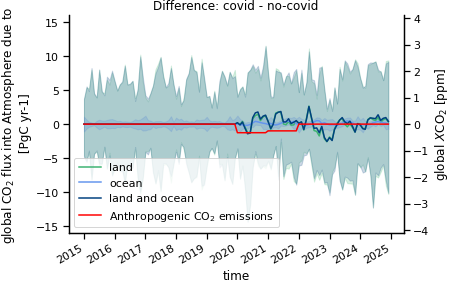

In [61]:
for v in ['land','ocean','land and ocean']:
    c=color_dict[v]
    plt.fill_between(diff.time.values, diff[v].min('member_id'), diff[v].max('member_id'), alpha=.2, color=c)
    diff[v].mean('member_id').plot(label=v, color=c)
emissions_diff.plot(label='Anthropogenic CO$_2$ emissions', color='r')
plt.title('Difference: covid - no-covid')
plt.ylabel('global CO$_2$ flux into Atmosphere due to \n [PgC yr-1]')
plt.legend(loc='lower left')

plt.ylim([-16,16])
par = plt.gca().twinx()
emissions_diff.plot(label='Anthropogenic CO$_2$ emissions', color='r',lw=0, ax=par)
par.set_ylim([-16/2.12*af,16/2.12*af]) # to ppm and account for airbourne fraction
par.set_ylabel('global $X$CO$_2$ [ppm]')

sns.despine(right=False)

In [62]:
ds_global = z.sel(time=slice('2020','2024')).map(global_aggregate)[[v for v in z.data_vars if 'lon' in z[v].dims]]
ds_global.update(z.sel(time=slice('2020','2024')).map(global_aggregate)[[v for v in z.data_vars if 'x' in z[v].dims]])
ds_global = ds_global.load()
global_covid_diff = ds_global.drop_sel(experiment_id='no-covid') - ds_global.sel(experiment_id='no-covid')

In [63]:
global_covid_diff = stack_members(global_covid_diff)

In [64]:
#co2_diff = global_covid_diff[['fco2fos','fco2nat']].to_array()
#co2_diff = global_covid_diff[['fco2fos','fco2nat','nbp']].to_array()

co2_diff = global_covid_diff
#co2_diff['fco2nat'] = co2_diff['nbp'] + co2_diff['fgco2']
co2_diff['nbp'] = -co2_diff['nbp']
co2_diff['fgco2'] = co2_diff.fco2nat - co2_diff.nbp
#co2_diff['co2'] = global_covid_diff['co2'] #* 2.12 # / af
co2_diff = co2_diff.rename({'fco2nat':'land and ocean','nbp':'land','fgco2':'ocean'})

co2_diff = co2_diff[['land and ocean','ocean','land','fco2fos']].to_array()

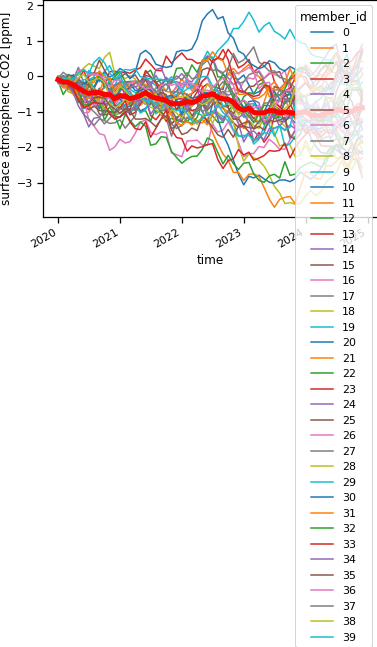

In [65]:
global_covid_diff.co2.plot(hue='member_id')
global_covid_diff.co2.mean('member_id').plot(lw=5, c='r', add_legend=None)

In [66]:
red = np.trapz((co2_diff/12).mean('member_id').sel(variable='fco2fos'))
'CO2 change in atmosphere due to covid CO2 emission reductions',round(red,3), 'PgC'

('CO2 change in atmosphere due to covid CO2 emission reductions',
 -2.203,
 'PgC')

In [67]:
red_with_feedback = np.trapz((co2_diff.sel(variable='fco2fos')/12 + co2_diff.drop_sel(variable='fco2fos')/12).mean('member_id'),axis=0)
'CO2 change in atmosphere due to covid with carbon feedback',red_with_feedback, 'PgC'

('CO2 change in atmosphere due to covid with carbon feedback',
 array([-1.73428324, -1.9909966 , -1.94610499]),
 'PgC')

In [68]:
red - red_with_feedback

array([-0.4685351 , -0.21182175, -0.25671335])

In [69]:
# change of initial reduction
red_with_feedback/red,'% of initial CO2 reduction in the ensemble mean with carbon feedback'

(array([0.78730198, 0.90384057, 0.88346141]),
 '% of initial CO2 reduction in the ensemble mean with carbon feedback')

In [70]:
co2_diff.coords

Coordinates:
  * time       (time) datetime64[ns] 2020-01-01 2020-02-01 ... 2024-12-01
  * member_id  (member_id) int64 0 1 2 3 4 5 6 7 8 ... 32 33 34 35 36 37 38 39
  * variable   (variable) object 'land and ocean' 'ocean' 'land' 'fco2fos'

In [71]:
d = xr.DataArray(np.trapz((co2_diff.sel(variable='fco2fos')/12 + co2_diff.drop_sel(variable='fco2fos')/12),axis=0), dims=['member_id','variable'], coords=co2_diff.drop_sel(variable='fco2fos').isel(time=0,drop=True).coords)

df = d.to_dataframe(name='yes')

df = df.unstack()['yes']#.rename(columns={'co2':'yes'})

In [72]:
df['prognostic'] = global_covid_diff['co2'].isel(time=-1).to_series() * 2.12 #/ af
df['no']=red

df=df.melt()

df=df.rename(columns={'variable':'feedback','value':'reduction'})
df.head()

,feedback,reduction
0,land and ocean,-1.678855
1,land and ocean,-4.397578
2,land and ocean,-2.180919
3,land and ocean,-3.411957
4,land and ocean,-1.588832


In [73]:
#df[df['feedback']=='prognostic']['reduction'].plot.hist()
df[df['feedback']=='prognostic']['reduction'].mean()/2.12*af, df[df['feedback']=='land and ocean']['reduction'].mean()/2.12*af,df[df['feedback']=='no']['reduction'].mean()/2.12*af

(-0.4855990629607673, -0.4453371565794089, -0.5656497353169447)

In [74]:
-0.48559906296076294 / -0.5656497353169442

0.8584801382231225

In [75]:
color_dict['prognostic']='orange'

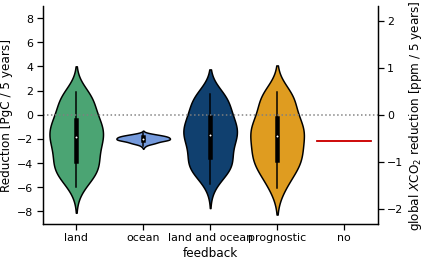

In [76]:
sns.violinplot(data=df,x='feedback', y='reduction', orient='v', palette=color_dict, order=['land','ocean','land and ocean','prognostic','no'], scale='width')
plt.axhline(y=0, c='gray', ls=':')
plt.axhline(y=red, xmin=.82, xmax=.98, color='red')

plt.ylabel('Reduction [PgC / 5 years]')

m=9
plt.ylim([-m,m])
par = plt.gca().twinx()
par.set_ylim([-m/2.12*af, m/2.12*af]) # to ppm and account for airbourne fraction
par.set_ylabel('global $X$CO$_2$ reduction [ppm / 5 years]')

sns.despine(right=False)

In [77]:
red_with_feedback = xr.DataArray(np.trapz(co2_diff.drop_sel(variable='land and ocean').sum('variable')/12,axis=0), dims=['member_id']).quantile(q=[.025,.5,.975],dim='member_id')
red_with_feedback

<xarray.DataArray (quantile: 3)>
array([-4.96306119, -1.63384352,  1.7237188 ])
Coordinates:
  * quantile  (quantile) float64 0.025 0.5 0.975

In [78]:
red

-2.202818343718373

In [79]:
red_with_feedback

<xarray.DataArray (quantile: 3)>
array([-4.96306119, -1.63384352,  1.7237188 ])
Coordinates:
  * quantile  (quantile) float64 0.025 0.5 0.975

In [80]:
# in ppm: /2.12 *af

In [81]:
red/2.12*af,'ppm'

(-0.5656497353169447, 'ppm')

In [82]:
(red_with_feedback/2.12*af).values,'ppm'

(array([-1.27443748, -0.41954579,  0.44262437]), 'ppm')

In [83]:
# change of initial reduction
(red_with_feedback)/(red)

<xarray.DataArray (quantile: 3)>
array([ 2.2530506 ,  0.74170597, -0.7825061 ])
Coordinates:
  * quantile  (quantile) float64 0.025 0.5 0.975

> - strong uptake by carbon cycle: 225%: doubled
> - not anomalous carbon cycle: 79%: -20% feedback
> - strong outgassing by carbon cycle: -78%: reversed

In [84]:
color_dict['land and ocean']='teal'

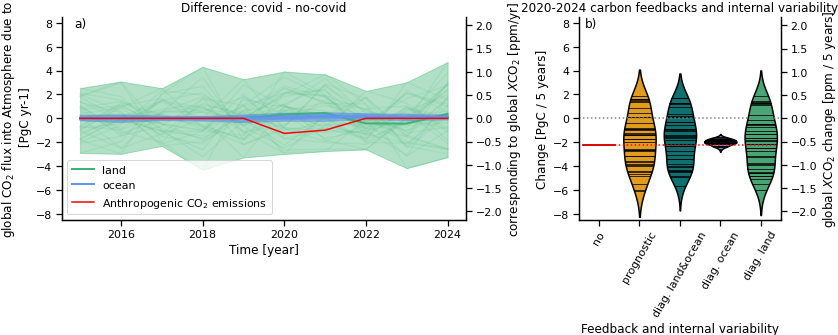

In [101]:
fig,ax=plt.subplots(ncols=2, figsize=(12,5), gridspec_kw={'width_ratios': [2, 1]})
show_members = True
axes=ax[0]
for i,v in enumerate(['land','ocean']): # rm 'land and ocean'
    c = color_dict[v]
    alpha = 0.5 + (i-1)*.1
    # print(v,alpha)
    axes.fill_between(diff_ym.year.values, diff_ym[v].min('member_id'), diff_ym[v].max('member_id'), alpha=alpha, color=c)
    if show_members and v in ["land","ocean"]:
        for m in diff_ym.member_id:
            diff_ym[v].sel(member_id=m).plot(color=c,alpha=.1,ax=axes)
    diff_ym[v].mean('member_id').plot(label=v, color=c,ax=axes, lw=2)
emissions_diff_ym.plot(label='Anthropogenic CO$_2$ emissions', color='r',ax=axes)
#axes.axvline(x=, c='gray', ls=':')
axes.set_title('Difference: covid - no-covid')
#axes.set_xlim([2019,None])
axes.set_xlabel('Time [year]')
axes.set_ylabel('global CO$_2$ flux into Atmosphere due to \n [PgC yr-1]')
axes.legend(loc='lower left')

m=8.5
axes.set_ylim([-m,m])
par = axes.twinx()
#emissions_diff.plot(label='Anthropogenic CO$_2$ emissions', color='r',lw=0, ax=par)
par.set_ylim([-m/2.12*af,m/2.12*af]) # to ppm and account for airbourne fraction
par.set_ylabel('corresponding to global $X$CO$_2$ [ppm/yr]')

axes=ax[1]
sns.violinplot(data=df,x='feedback', y='reduction', orient='v', palette=color_dict, inner="stick", #bw=.2,
               scale='width',ax=axes, order=['land','ocean','land and ocean','prognostic','no'][::-1])
axes.axhline(y=0, c='gray', ls=':') # zero
# no feedback: just diagnostic from fco2nat/antt
axes.axhline(y=red, xmin=.02, xmax=.98, color='red', ls=':')
axes.axhline(y=red, xmin=.02, xmax=.18, color='red')

axes.set_ylabel('Change [PgC / 5 years]')
axes.set_title('2020-2024 carbon feedbacks and internal variability')
axes.set_xticklabels(['diag. land','diag. ocean','diag. land&ocean','prognostic','no'][::-1])

#m=8
axes.set_ylim([-m,m])
par = axes.twinx()
par.set_ylim([-m/2.12*af, m/2.12*af]) # to ppm and account for airbourne fraction
par.set_ylabel('global $X$CO$_2$ change [ppm / 5 years]')
axes.set_xlabel('Feedback and internal variability')
axes.set_xticklabels(labels=axes.xaxis.get_ticklabels(),rotation=60)

sns.despine(right=False)
annotate_figurelabels(ax)
plt.tight_layout()
plt.savefig(f'Fig_3_feedback_internal_variability')

In [259]:
df[df.feedback=='prognostic'].max()

feedback     prognostic
reduction      1.904193
dtype: object

## Fig. 4

maps fco2 calendar year

In [128]:
find_ext = (z.fco2nat.sel(time=slice('2020','2024'))*area).sum(['lon','lat']).drop_sel(experiment_id='no-covid').stack(m=['member_id','experiment_id']).cumsum('time').compute()

In [129]:
find_ext.sel(time='2023').min('time').idxmin('m')

<xarray.DataArray 'm' ()>
array(('r4i1p1f99', 'cov-strgreen'), dtype=object)
Attributes:
    code:       5
    long_name:  Surface Carbon Mass Flux into the Atmosphere Due to Natural S...
    name:       fco2nat
    table:      255
    units:      kg m-2 s-1

In [130]:
find_ext.sel(time='2023').max('time').idxmax('m')

<xarray.DataArray 'm' ()>
array(('r7i1p1f99', 'cov-modgreen'), dtype=object)
Attributes:
    code:       5
    long_name:  Surface Carbon Mass Flux into the Atmosphere Due to Natural S...
    name:       fco2nat
    table:      255
    units:      kg m-2 s-1

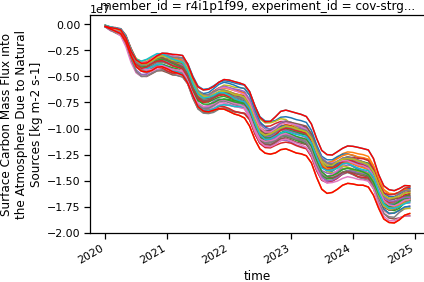

In [131]:
find_ext.assign_coords(m=np.arange(40)).plot(hue='m')
find_ext.unstack('m').sel(member_id='r7i1p1f99', experiment_id='cov-modgreen').plot(c='r')
find_ext.unstack('m').sel(member_id='r4i1p1f99', experiment_id='cov-strgreen').plot(c='r')
plt.gca().get_legend().remove()
plt.show()

In [260]:
ext = yearmean(xr.concat([
    z.sel(member_id='r7i1p1f99', experiment_id='cov-modgreen', drop=True),
    z.sel(experiment_id='no-covid', drop=True).mean('member_id'),
    z.drop_sel(experiment_id='no-covid').mean(['member_id','experiment_id']),
    z.sel(member_id='r4i1p1f99', experiment_id='cov-strgreen',drop=True)
],'member_id').assign_coords(member_id=['pos covid','mean no-covid','mean covid','neg covid']).sel(time=slice('2015','2024'))).compute()

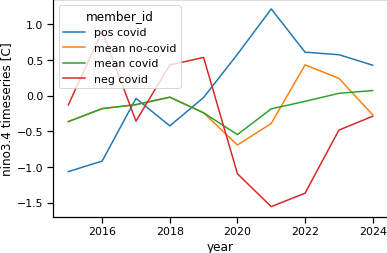

In [261]:
# looks like covid triggers La Nina in mean
ext.nino34.plot(hue='member_id')

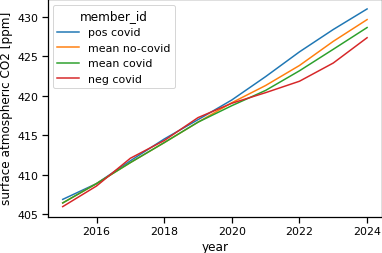

In [262]:
ext.co2.weighted(area).mean(['lon','lat']).plot(hue='member_id')

In [263]:
# anomaly
#ext_p = (ext - yearmean(z.sel(time=slice('2020','2024'))).mean(['member_id','experiment_id','year'])).compute()
ext_p = (ext - yearmean(z.sel(time=slice('2020','2024'))).mean(['member_id','experiment_id','year'])).compute()

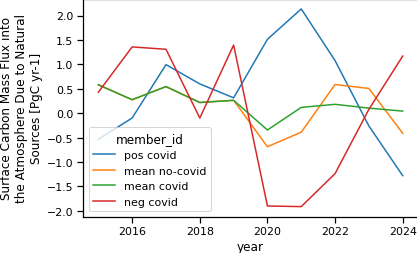

In [264]:
(ext_p['fco2nat']*area*60*60*24*365*1e-12).assign_attrs({'units':'PgC yr-1'}).sum(['lon','lat']).plot(hue='member_id')

In [265]:
sns.set_palette(sns.xkcd_palette(['faded red','black','blue','faded green']))

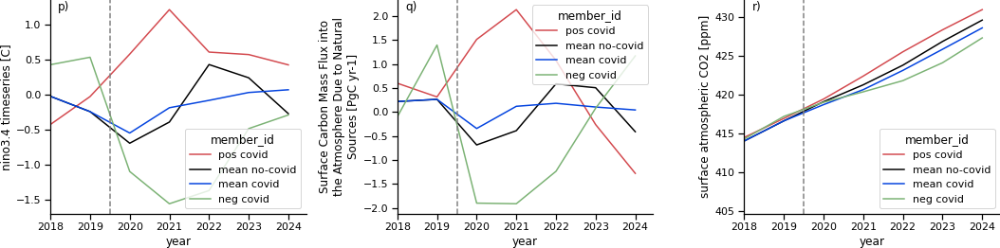

In [268]:
# add shading of all members
fig,ax=plt.subplots(ncols=3, figsize=(15,4))
ext.nino34.plot(hue='member_id',ax=ax[0])
(ext_p['fco2nat']*area*60*60*24*365*1e-12).assign_attrs({'units':'PgC yr-1'}).sum(['lon','lat']).plot(hue='member_id',ax=ax[1])
ext.co2.weighted(area).mean(['lon','lat']).plot(hue='member_id',ax=ax[2])
for i in range(3):
    ax[i].axvline(x=2020-.5,ls='--',c='gray')
    ax[i].set_xlim([2018,None])

annotate_figurelabels(ax, shift=15)
sns.despine()
plt.tight_layout()
plt.savefig('Fig_SI_members_timeseries')

In [133]:
ext = ext.sel(year=slice(2020,2024))

In [134]:
#ext.sel(year=slice('2020','2024')).co2.plot_map(col='year', row='member_id', robust=True, aspect=2)

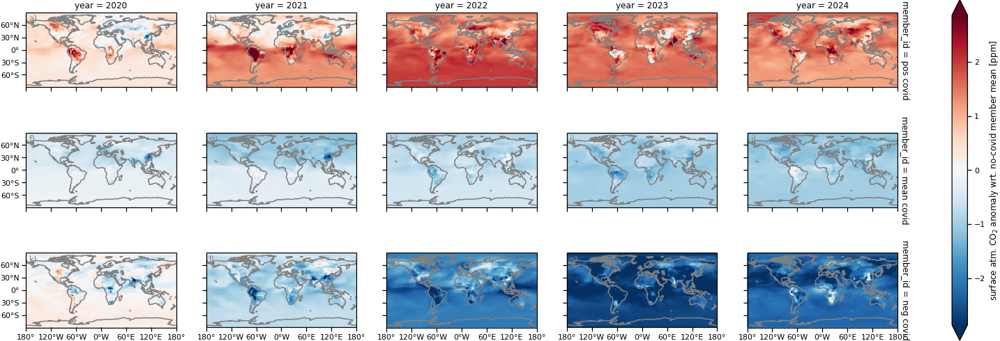

In [154]:
fg = (ext-ext.sel(member_id='mean no-covid')).drop_sel(member_id='mean no-covid').sel(year=slice('2020','2024')).co2.plot_map(
    col='year', row='member_id', robust=True, aspect=1.8, cbar_kwargs=dict(
        label='surface atm. CO$_2$ anomaly wrt. no-covid member mean [ppm]'))

annotate_figurelabels(fg.axes, xy=(.02, .88), color='gray')
plt.savefig('Fig_4_members_co2_maps')

In [ ]:
#ext_p.sel(year=slice('2020','2024')).fco2nat.plot_map(col='year', row='member_id', robust=True, aspect=2,cbar_kwargs=dict(
#        label='surface carbon mass flux anomaly wrt. climatology [kg m-2 s-1]'))
#plt.savefig('Fig_SI_members_fco2nat_maps', dpi=100)

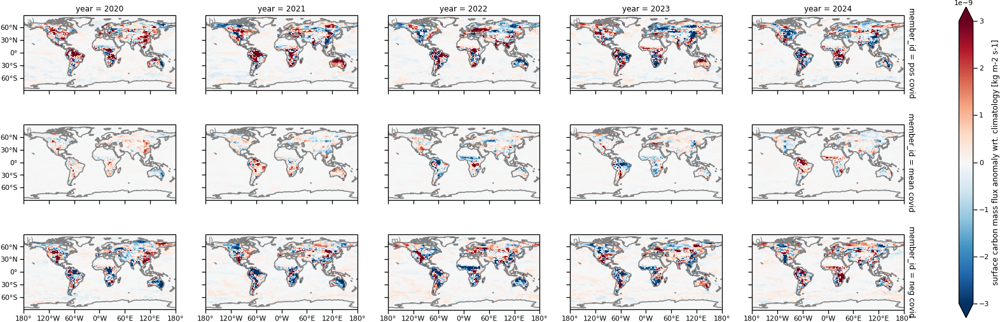

In [156]:
fg = (ext-ext.sel(member_id='mean no-covid')).drop_sel(member_id='mean no-covid').sel(year=slice('2020','2024')).fco2nat.plot_map(
    col='year', row='member_id', robust=True, vmin=-3e-9, vmax=3e-9, cmap='RdBu_r', aspect=2,cbar_kwargs=dict(
        label='surface carbon mass flux anomaly wrt. climatology [kg m-2 s-1]'))
annotate_figurelabels(fg.axes, xy=(.02, .88), color='gray')
plt.savefig('Fig_SI_members_fco2nat_maps', dpi=100)

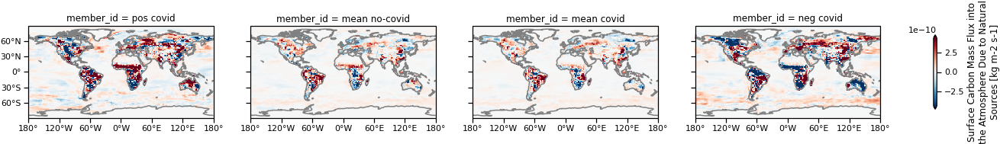

In [137]:
ext_p.mean('year').fco2nat.plot_map(col='member_id', robust=True, aspect=2)

## Fig SI Emission reductions

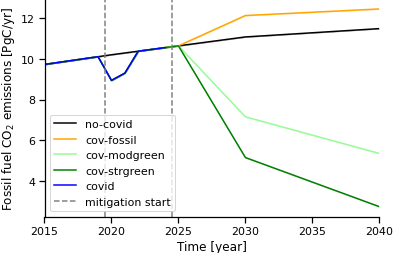

In [181]:
fco2fos = yearmean(global_emissions).expand_dims('member_id')
plot_ensembles(fco2fos, mitigation_date=[2020-.5,2024.5])
plt.xlim([2015,None])
plt.legend(loc='lower left')
plt.ylabel('Fossil fuel CO$_2$ emissions [PgC/yr]')
sns.despine()
#plt.savefig('Fig_SI_fco2fos_timeseries')

In [182]:
od = yearmean(z.od550aer).mean(['lon','lat']).compute()

In [183]:
od.attrs

{'cell_measures': 'area: areacella',
 'cell_methods': 'area: time: mean',
 'comment': "AOD from the ambient aerosols (i.e., includes aerosol water).  Does not include AOD from stratospheric aerosols if these are prescribed but includes other possible background aerosol types. Needs a comment attribute 'wavelength: 550nm'",
 'coordinates': 'wavelength',
 'history': "2019-11-15T00:32:58Z altered by CMOR: Treated scalar dimension: 'wavelength'. 2019-11-15T00:32:58Z altered by CMOR: replaced missing value flag (-9e+33) and corresponding data with standard missing value (1e+20). 2019-11-15T00:32:59Z altered by CMOR: Inverted axis: lat.",
 'long_name': 'Ambient Aerosol Optical Thickness at 550nm',
 'original_name': 'od550aer',
 'standard_name': 'atmosphere_optical_thickness_due_to_ambient_aerosol_particles',
 'units': '1'}

In [196]:
l = 'Global ambient Aerosol Optical\n Thickness at 550nm [1]'

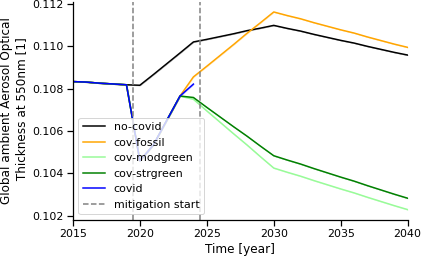

In [197]:
plot_ensembles(od,mitigation_date=[2019.5,2024.5])
plt.xlim([2015,None])
plt.legend(loc='lower left')
plt.ylabel(l)
sns.despine()
#plt.savefig('Fig_SI_od550aer_timeseries')

In [186]:
o3 = yearmean(z.o3).mean(['lon','lat']).compute()

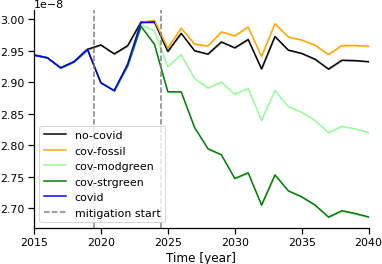

In [187]:
plot_ensembles(o3,mitigation_date=[2019.5,2024.5])
plt.xlim([2015,None])
plt.legend(loc='lower left')
#plt.ylabel(l)
sns.despine()
#plt.savefig('Fig_SI_o3_timeseries')

In [195]:
o3.attrs

{'cell_measures': 'area: areacella',
 'cell_methods': 'time: mean',
 'comment': 'Mole fraction is used in the construction mole_fraction_of_X_in_Y, where X is a material constituent of Y.',
 'history': '2019-11-15T00:32:59Z altered by CMOR: Reordered dimensions, original order: time lat lon plev. 2019-11-15T00:32:59Z altered by CMOR: replaced missing value flag (-9e+33) and corresponding data with standard missing value (1e+20). 2019-11-15T00:32:59Z altered by CMOR: Inverted axis: lat.',
 'long_name': 'Mole Fraction of O3',
 'original_name': 'o3',
 'standard_name': 'mole_fraction_of_ozone_in_air',
 'units': 'mol mol-1'}

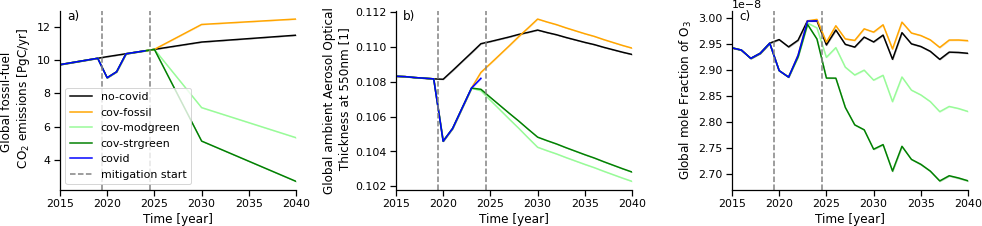

In [212]:
fig,ax=plt.subplots(ncols=3, figsize=(14,3.5))
plot_ensembles(fco2fos,mitigation_date=[2019.5,2024.5],ax=ax[0])
ax[0].set_ylabel('Global fossil-fuel \n CO$_2$ emissions [PgC/yr]')
plot_ensembles(od,mitigation_date=[2019.5,2024.5],ax=ax[1])
ax[1].set_ylabel(l)
plot_ensembles(o3,mitigation_date=[2019.5,2024.5],ax=ax[2])
ax[2].set_ylabel('Global mole Fraction of O$_3$')
plt.xlim([2015,None])
for i in np.arange(3):
    ax[i].set_xlim([2015,None])
    if i!=0:
        ax[i].legend().remove()
ax[0].legend(loc='lower left')
sns.despine()
plt.tight_layout()
annotate_figurelabels(ax)#, color='white', xy=(.02,.90))
plt.savefig('Fig_SI_forcing_timeseries')

In [226]:
z.experiment_id

<xarray.DataArray 'experiment_id' (experiment_id: 5)>
array(['no-covid', 'cov-fossil', 'cov-modgreen', 'cov-strgreen', 'covid'],
      dtype='<U12')
Coordinates:
  * experiment_id  (experiment_id) <U12 'no-covid' 'cov-fossil' ... 'covid'

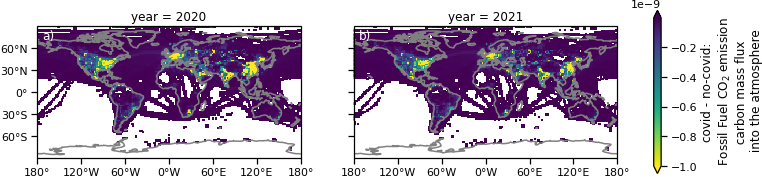

In [239]:
d = yearmean((z.fco2fos.sel(experiment_id='covid').isel(member_id=0, drop=True) - z.fco2fos.sel(experiment_id='no-covid').isel(member_id=0, drop=True)).sel(time=slice('2020','2021'))).compute()
d = d.where(d<-1e-12)
fg = d.plot_map(
    col='year', robust=True, cmap='viridis_r',aspect=2, vmin=-1e-9, cbar_kwargs=dict(
        label=f'covid - no-covid:\n Fossil Fuel CO$_2$ emission \n carbon mass flux \n into the atmosphere'))
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
plt.savefig('Fig_SI_fco2fos_maps')

## Fig SI CO2 changes

In [213]:
co2.experiment_id

<xarray.DataArray 'experiment_id' (experiment_id: 2)>
array(['covid', 'no-covid'], dtype='<U8')
Coordinates:
  * experiment_id  (experiment_id) <U8 'covid' 'no-covid'

In [216]:
#co2 = yearmean(z[['co2','fco2nat']])
co2_diff_ym = -(co2.diff('experiment_id').mean('member_id')).sel(year=slice(2020,2024)).squeeze(drop=True)

co2_ym_std = -(co2-co2.mean('member_id')).sel(year=slice('2020','2024')).sel(experiment_id='no-covid', drop=True).std(['member_id','year'])

co2_ym_plot = xr.concat([co2_diff_ym,co2_ym_std.assign_coords(year='std')], dim='year').compute()

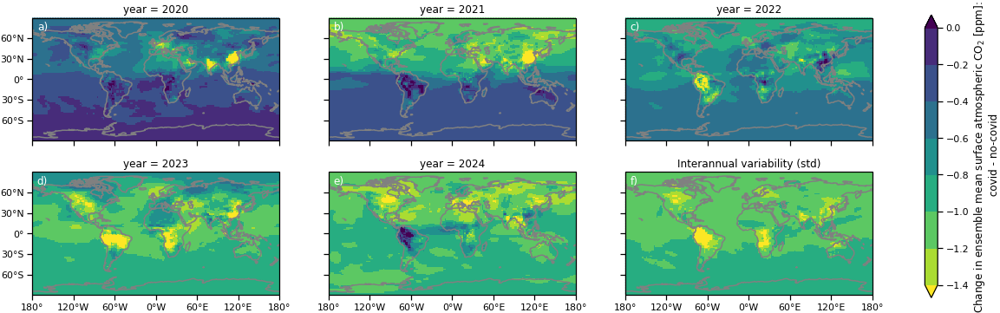

In [217]:
fg = co2_ym_plot.co2.plot_map(col='year',robust=True, col_wrap=3, levels=8, aspect=2.3, cmap='viridis_r',
                              cbar_kwargs=dict(shrink=1, 
                                               label='Change in ensemble mean surface atmospheric CO$_2$ [ppm]: \n covid - no-covid'))
fg.axes[-1,-1].set_title('Interannual variability (std)')
annotate_figurelabels(fg.axes, color='white', xy=(.02,.90))
plt.savefig('Fig_SI_diff_co2')

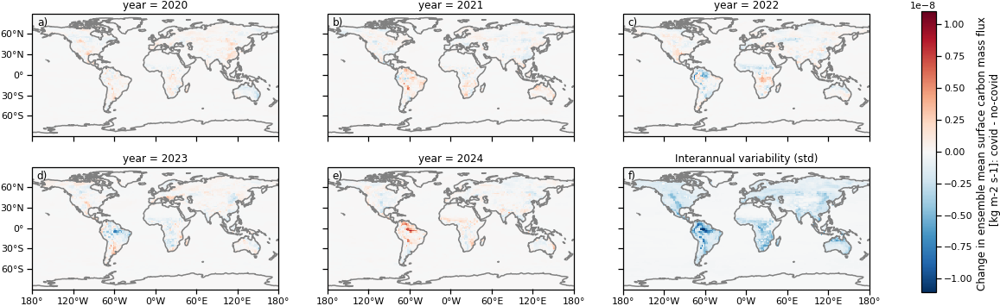

In [219]:
fg = co2_ym_plot.fco2nat.plot_map(col='year',robust=False, col_wrap=3, aspect=2.3, cmap='RdBu_r', levels=None,
                                  cbar_kwargs=dict(shrink=1,
                                                   label='Change in ensemble mean surface carbon mass flux \n [kg m-2 s-1]: covid - no-covid'))
fg.axes[-1,-1].set_title('Interannual variability (std)')
annotate_figurelabels(fg.axes, xy=(.02,.90))
plt.savefig('Fig_SI_diff_fco2nat')

# global timeseries

In [458]:
ds_global = z.sel(time=slice('2019-12',None)).map(global_aggregate)[[v for v in z.data_vars if 'lon' in z[v].dims]]
ds_global.update(z.sel(time=slice('2019-12',None)).map(global_aggregate)[[v for v in z.data_vars if 'x' in z[v].dims]])
ds_global = ds_global.load()
global_covid_diff = ds_global.drop_sel(experiment_id='no-covid') - ds_global.sel(experiment_id='no-covid')

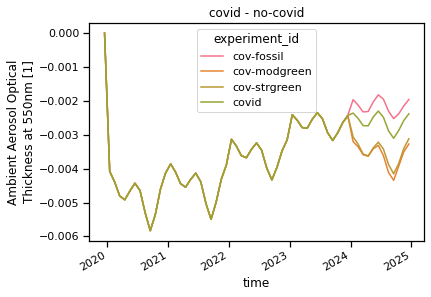

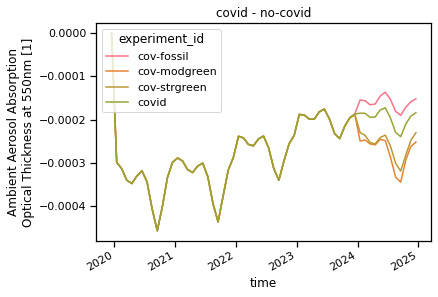

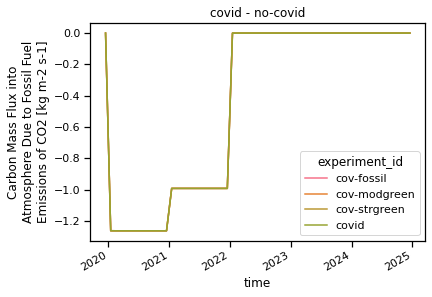

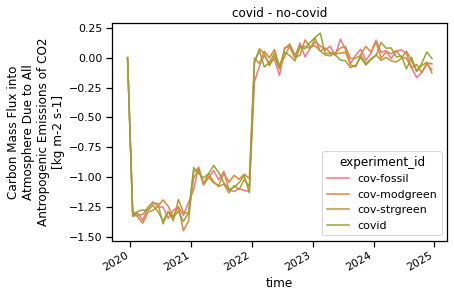

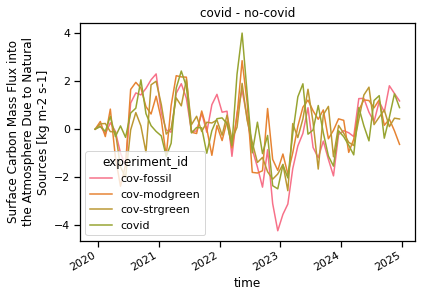

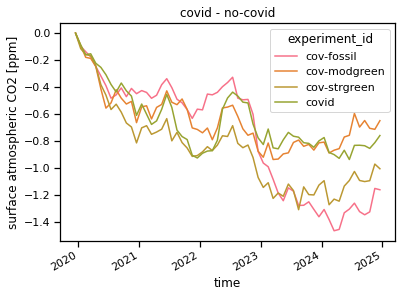

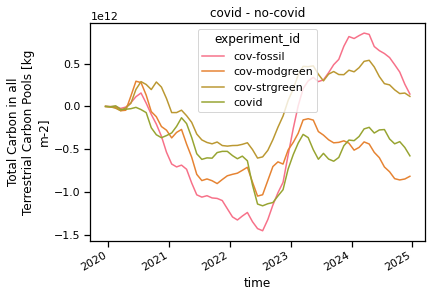

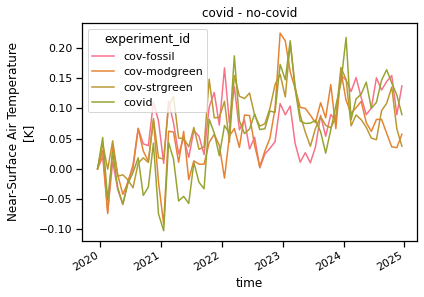

In [464]:
for v in ['od550aer','abs550aer','fco2fos','fco2antt','fco2nat','co2','cLand','tas']:
    global_covid_diff[v].mean('member_id').plot(hue='experiment_id')
    plt.title('covid - no-covid')
    plt.show()

In [174]:
ds = z.sel(time=slice('2019-12','2021-02'))
covid_diff = ds.drop_sel(experiment_id='no-covid') - ds.sel(experiment_id='no-covid')
covid_diff = covid_diff.compute()

In [175]:
fg_kwargs = dict(col='time', col_wrap=3, robust=True, aspect=2.1)
subtitle_kwargs = dict(y=0.92, x=.45, fontsize=16)

In [176]:
covid_diff = stack_members(covid_diff)

Text(0.45, 0.92, 'ensemble mean difference due to COVID-19 in atm. CO$_2$: covid - no-covid')

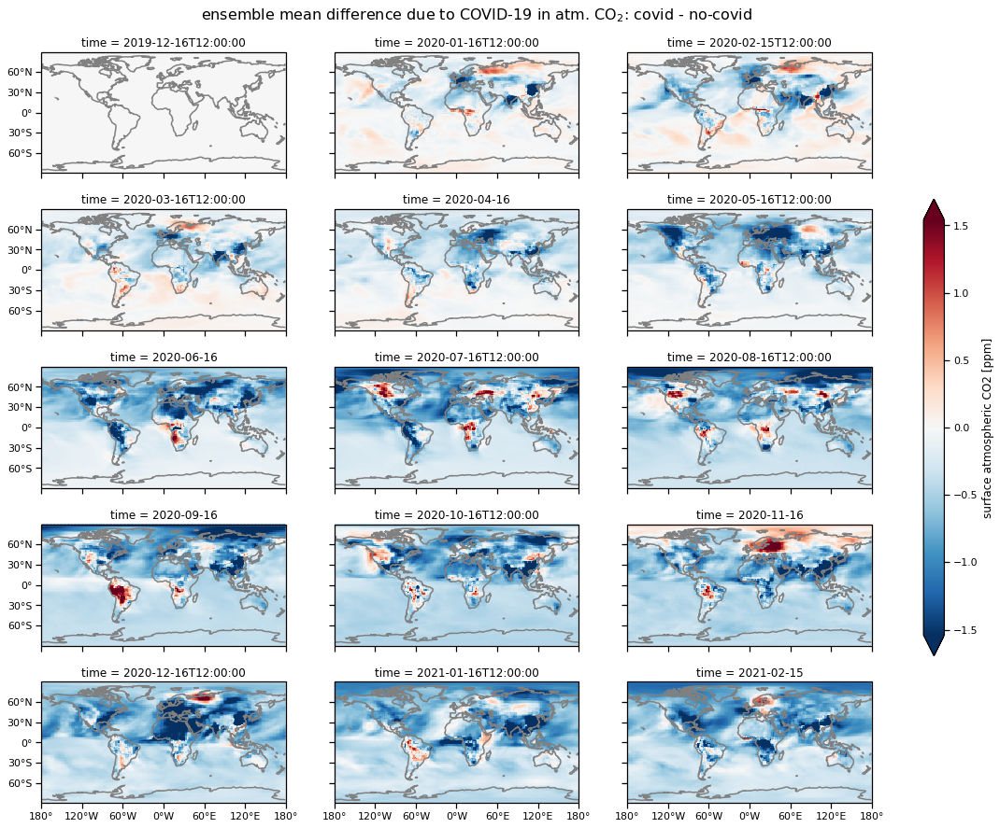

In [76]:
covid_diff.mean('member_id').co2.plot_map(**fg_kwargs)
plt.suptitle('ensemble mean difference due to COVID-19 in atm. CO$_2$: covid - no-covid',**subtitle_kwargs)

Text(0.45, 0.92, 'ensemble mean difference due to COVID-19 in atmospheric optical depth (AOD): covid - no-covid')

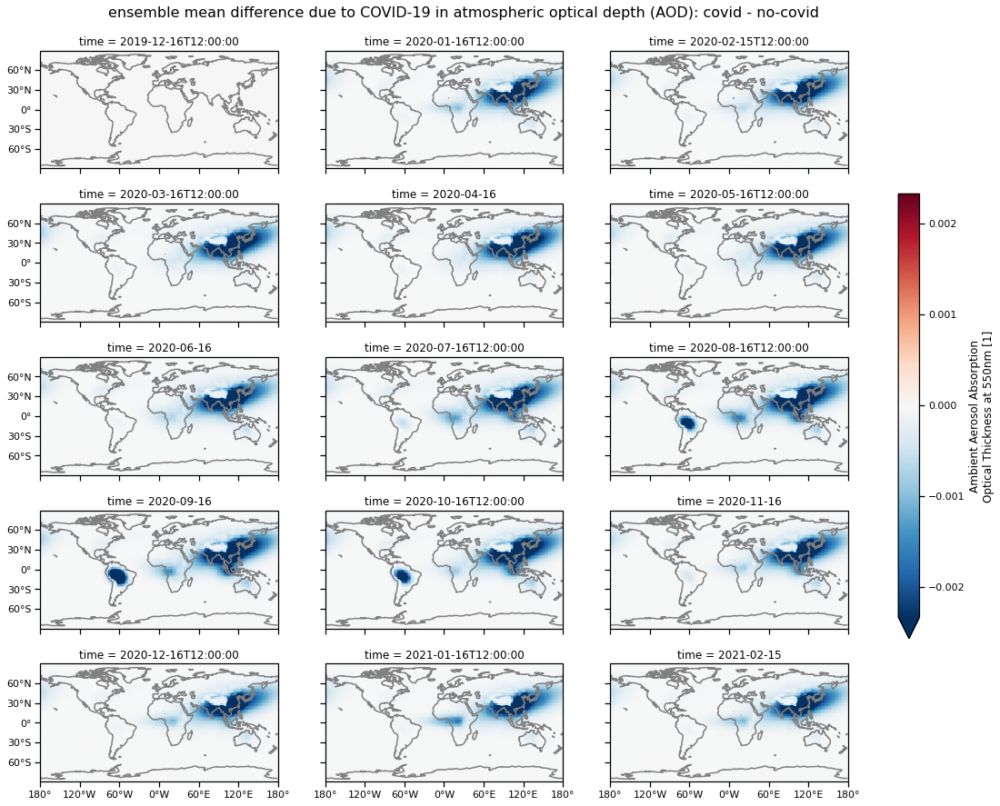

In [77]:
covid_diff.mean('member_id').abs550aer.plot_map(**fg_kwargs)
plt.suptitle('ensemble mean difference due to COVID-19 in atmospheric optical depth (AOD): covid - no-covid',**subtitle_kwargs)

In [68]:
#z.data_vars

Text(0.45, 0.92, 'ensemble mean difference due to COVID-19 in CO2 emissions: covid - no-covid')

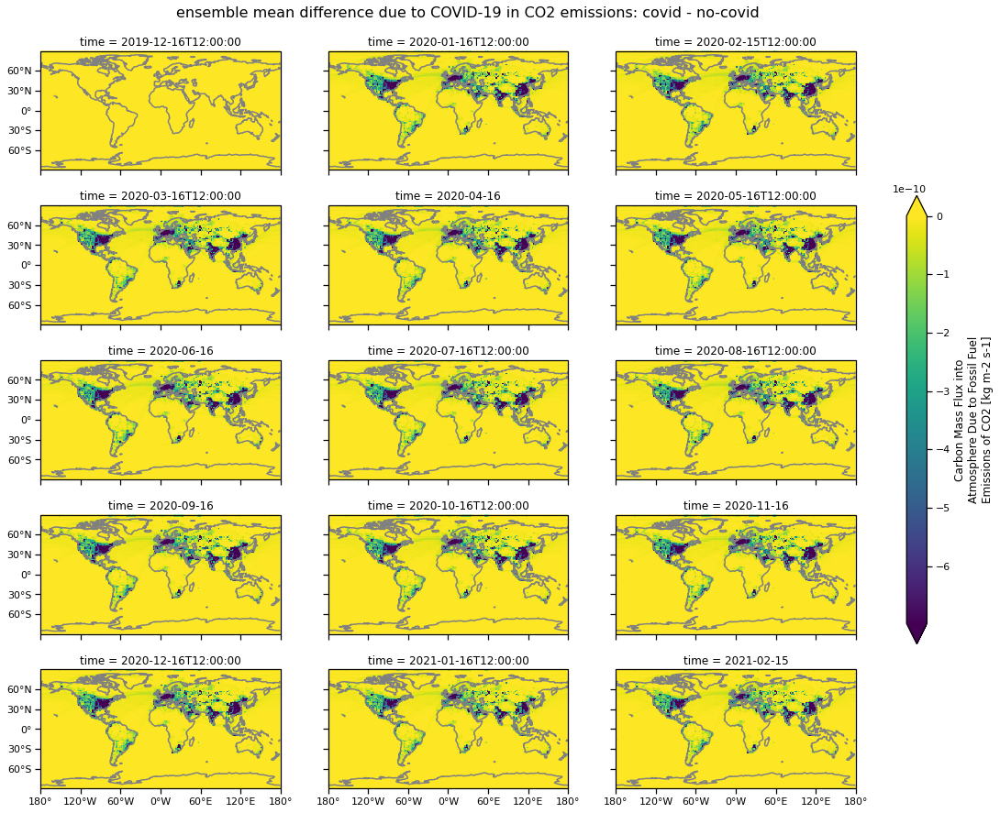

In [72]:
covid_diff.mean('member_id').fco2fos.plot_map(**fg_kwargs)
plt.suptitle('ensemble mean difference due to COVID-19 in CO2 emissions: covid - no-covid',**subtitle_kwargs)

Text(0.45, 0.92, 'ensemble mean difference due to COVID-19 in natural CO$_2$ fluxes: covid - no-covid')

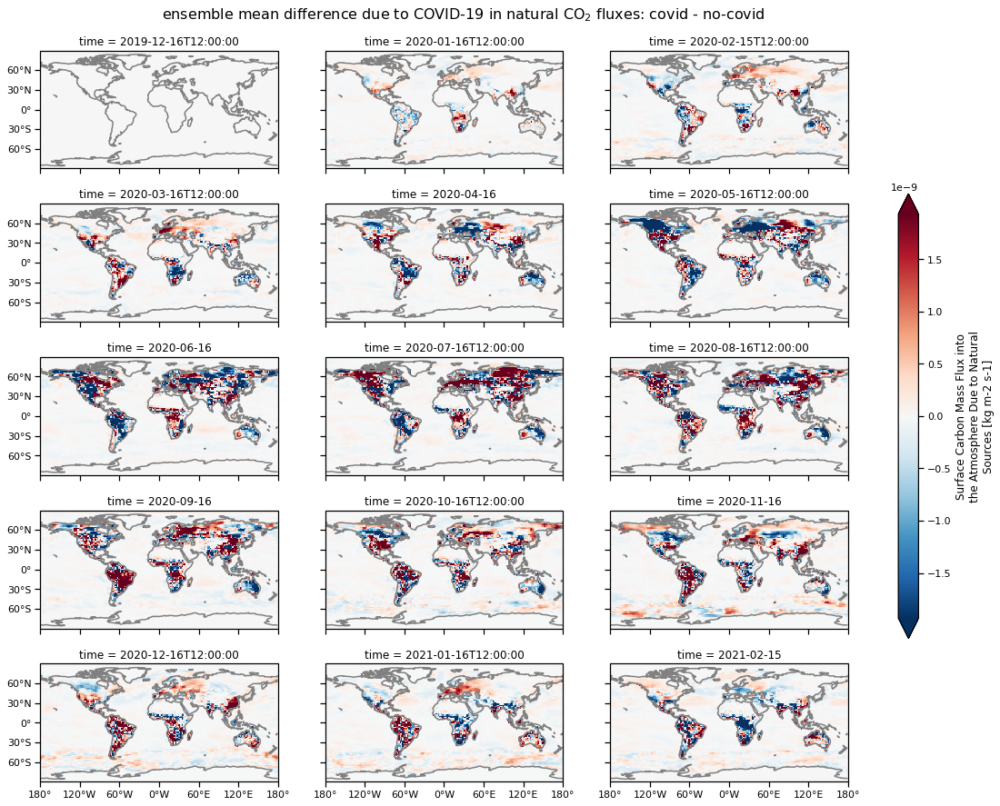

In [63]:
covid_diff.mean('member_id').fco2nat.plot_map(**fg_kwargs)
plt.suptitle('ensemble mean difference due to COVID-19 in natural CO$_2$ fluxes: covid - no-covid',**subtitle_kwargs)

In [ ]:
# scale fco2nat with fco2fos

Text(0.45, 0.92, 'ensemble mean difference due to COVID-19 in surface air temperature: covid - no-covid')

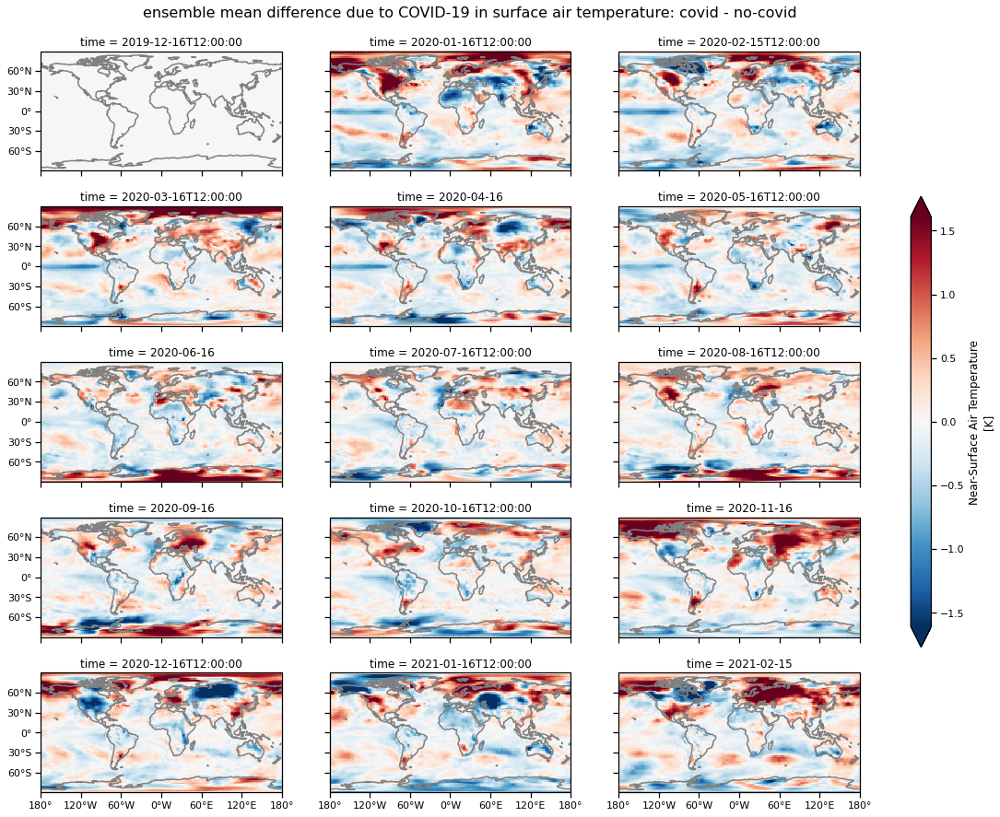

In [65]:
covid_diff.mean('member_id').tas.plot_map(**fg_kwargs)
plt.suptitle('ensemble mean difference due to COVID-19 in surface air temperature: covid - no-covid',**subtitle_kwargs)

Text(0.45, 0.92, 'ensemble mean difference due to COVID-19 in precipitation: covid - no-covid')

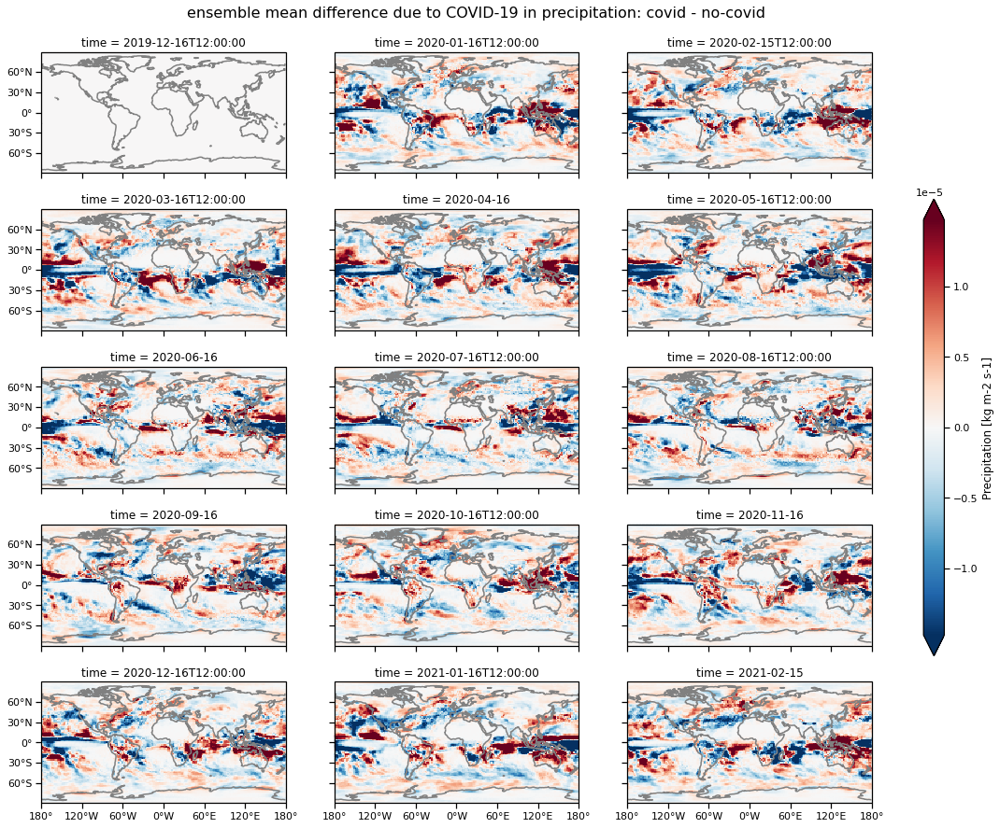

In [66]:
covid_diff.mean('member_id').pr.plot_map(**fg_kwargs)
plt.suptitle('ensemble mean difference due to COVID-19 in precipitation: covid - no-covid',**subtitle_kwargs)